/home/jay/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/home/jay/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
/home/jay/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:50: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


image shape: (600, 800)
car pixels: 4303
non-car pixels: 475697
road pixels: 81809
non-road pixels: 398191


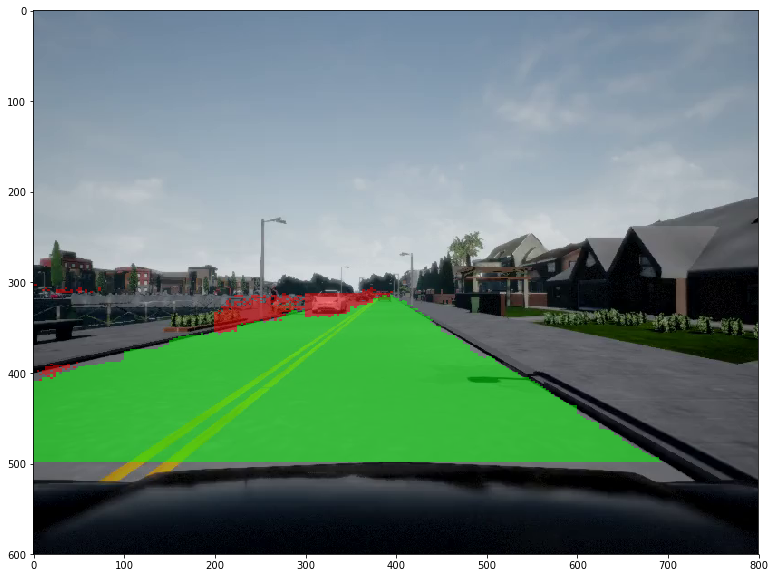

image shape: (600, 800)
car pixels: 4356
non-car pixels: 475644
road pixels: 81072
non-road pixels: 398928


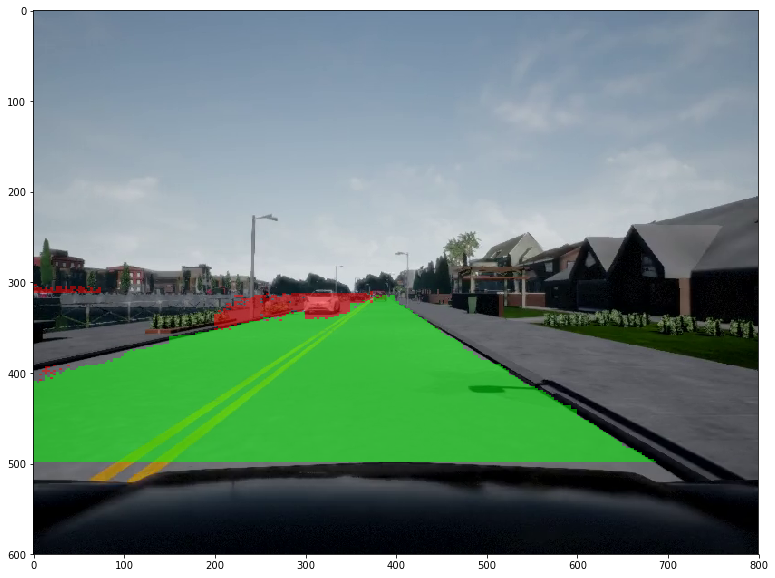

image shape: (600, 800)
car pixels: 3996
non-car pixels: 476004
road pixels: 81253
non-road pixels: 398747


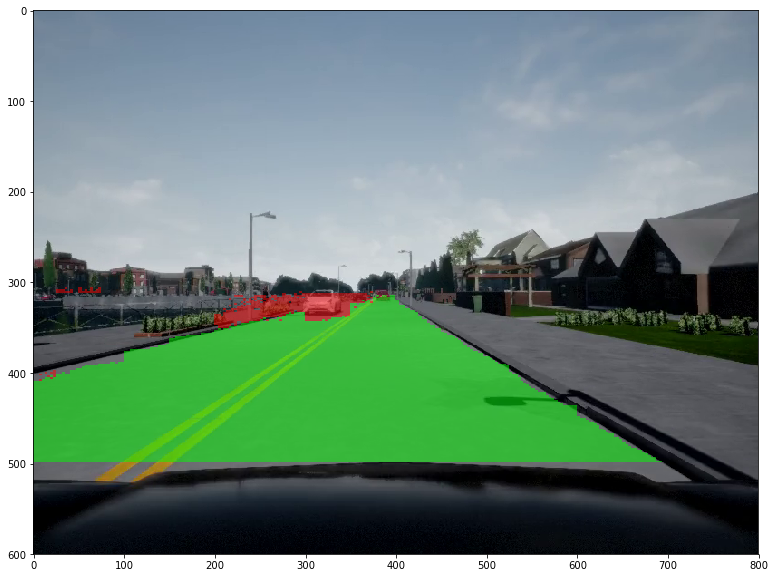

image shape: (600, 800)
car pixels: 2899
non-car pixels: 477101
road pixels: 81909
non-road pixels: 398091


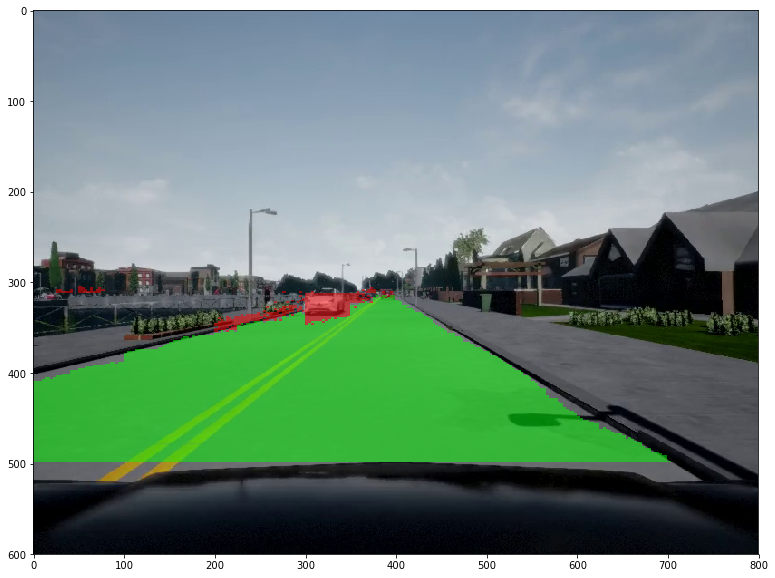

image shape: (600, 800)
car pixels: 2971
non-car pixels: 477029
road pixels: 83626
non-road pixels: 396374


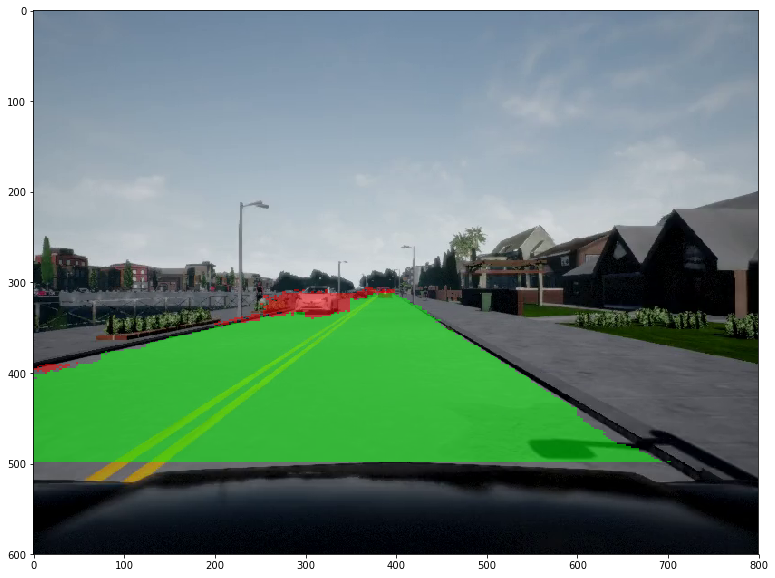

image shape: (600, 800)
car pixels: 2952
non-car pixels: 477048
road pixels: 87017
non-road pixels: 392983


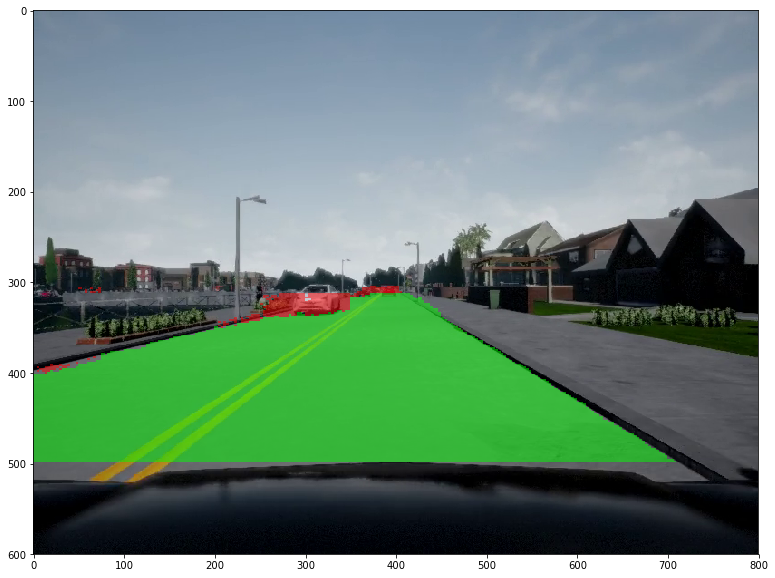

image shape: (600, 800)
car pixels: 2417
non-car pixels: 477583
road pixels: 88802
non-road pixels: 391198


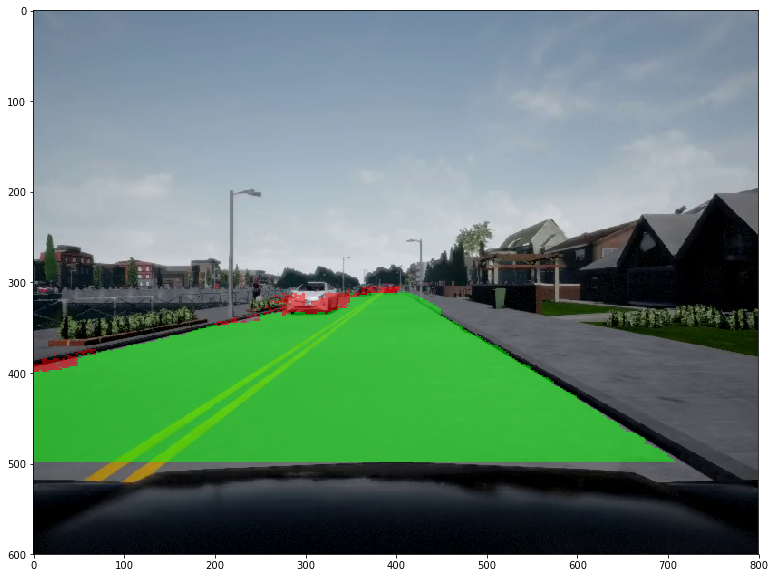

image shape: (600, 800)
car pixels: 3502
non-car pixels: 476498
road pixels: 88359
non-road pixels: 391641


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


image shape: (600, 800)
car pixels: 2598
non-car pixels: 477402
road pixels: 91777
non-road pixels: 388223


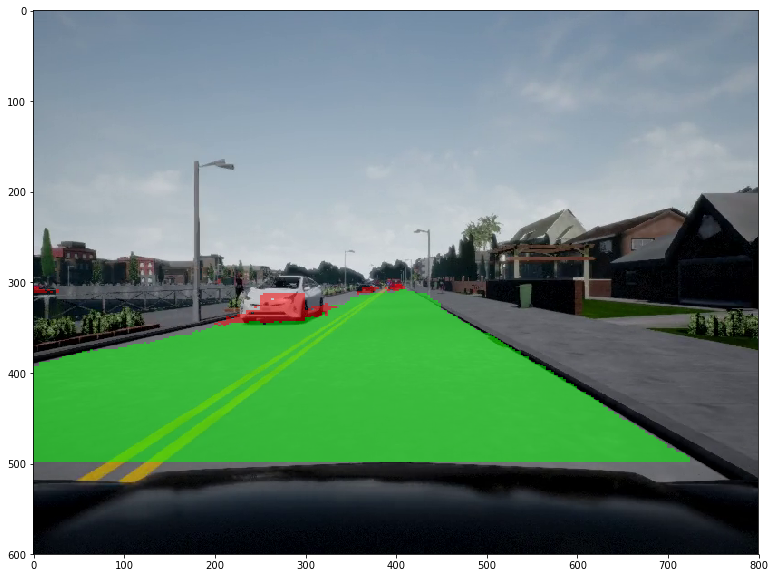

image shape: (600, 800)
car pixels: 3848
non-car pixels: 476152
road pixels: 92108
non-road pixels: 387892


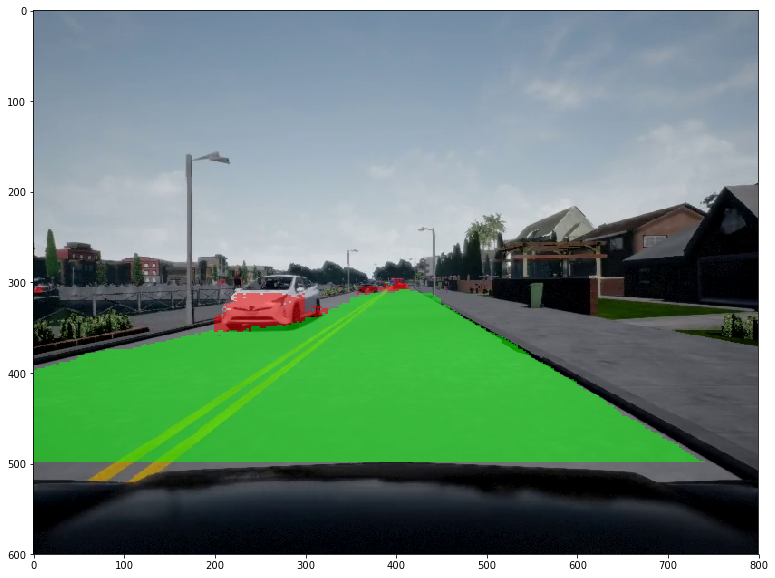

image shape: (600, 800)
car pixels: 5696
non-car pixels: 474304
road pixels: 90738
non-road pixels: 389262


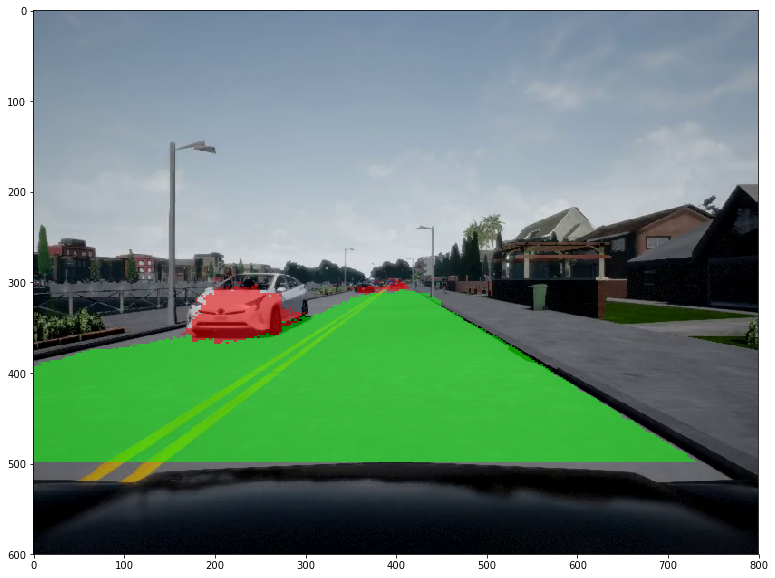

image shape: (600, 800)
car pixels: 7366
non-car pixels: 472634
road pixels: 89506
non-road pixels: 390494


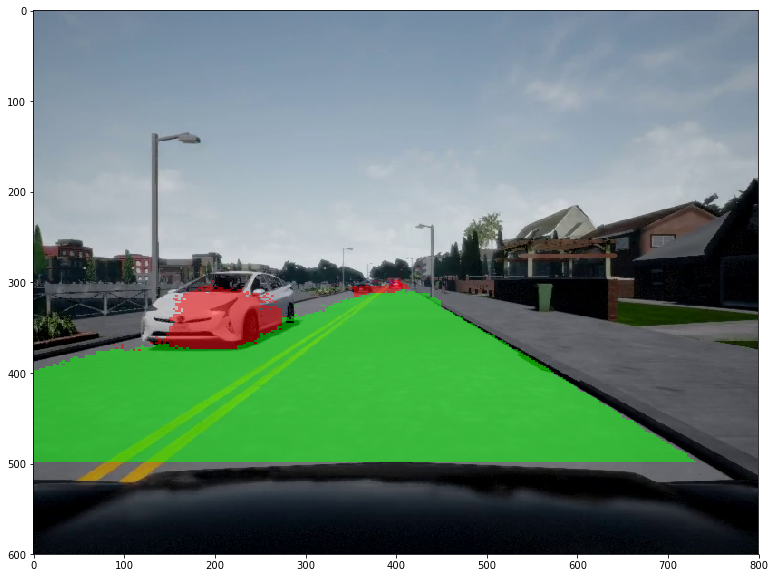

image shape: (600, 800)
car pixels: 16001
non-car pixels: 463999
road pixels: 87679
non-road pixels: 392321


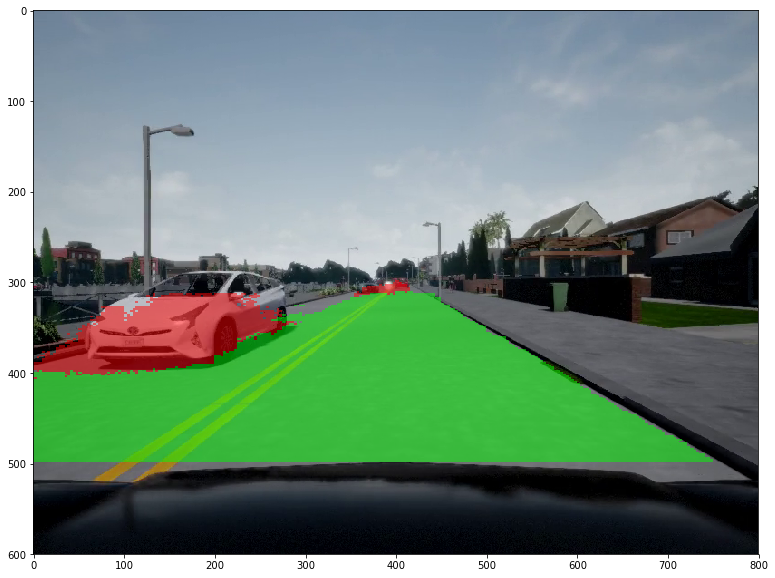

image shape: (600, 800)
car pixels: 15985
non-car pixels: 464015
road pixels: 87685
non-road pixels: 392315


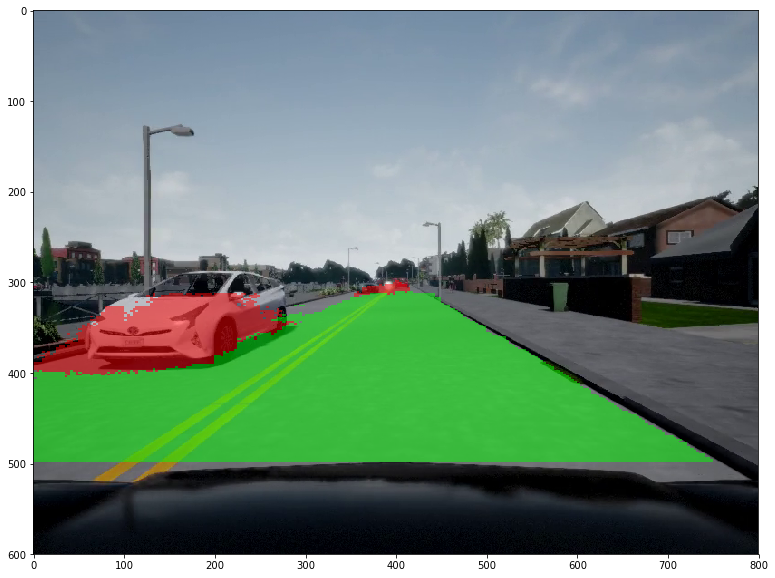

image shape: (600, 800)
car pixels: 24606
non-car pixels: 455394
road pixels: 83924
non-road pixels: 396076


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


image shape: (600, 800)
car pixels: 23215
non-car pixels: 456785
road pixels: 81663
non-road pixels: 398337


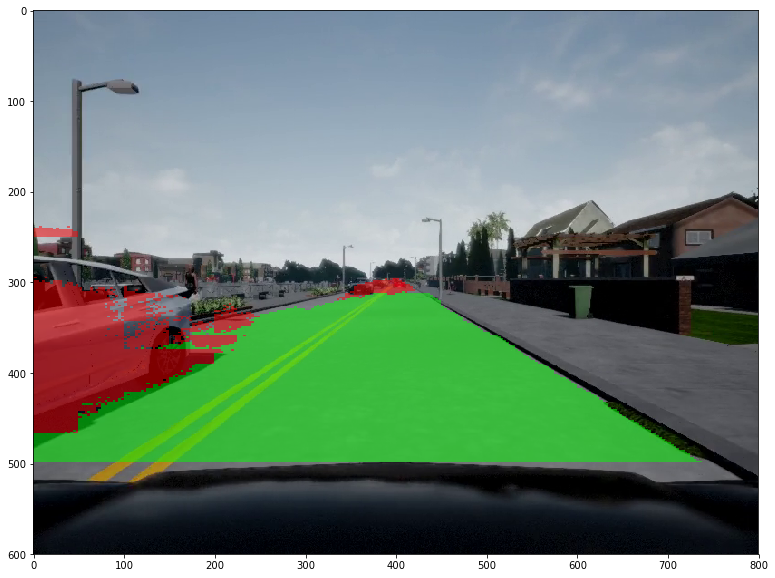

image shape: (600, 800)
car pixels: 21013
non-car pixels: 458987
road pixels: 83234
non-road pixels: 396766


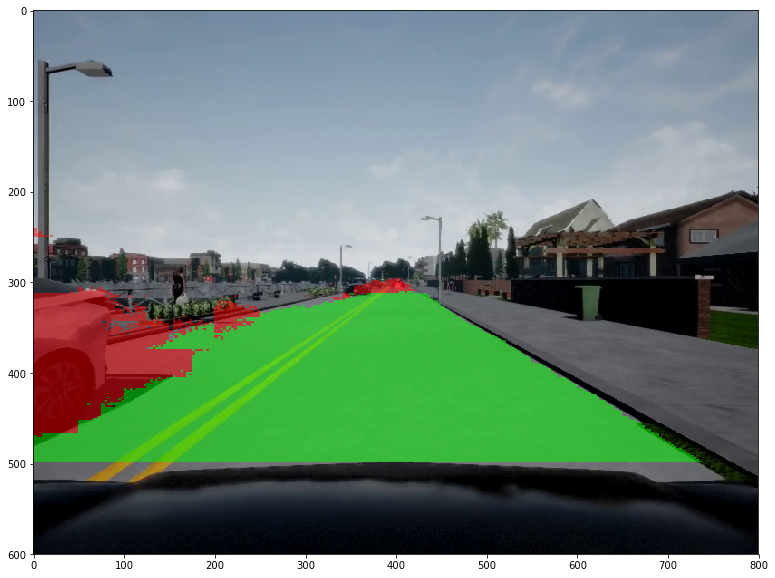

image shape: (600, 800)
car pixels: 11760
non-car pixels: 468240
road pixels: 89030
non-road pixels: 390970


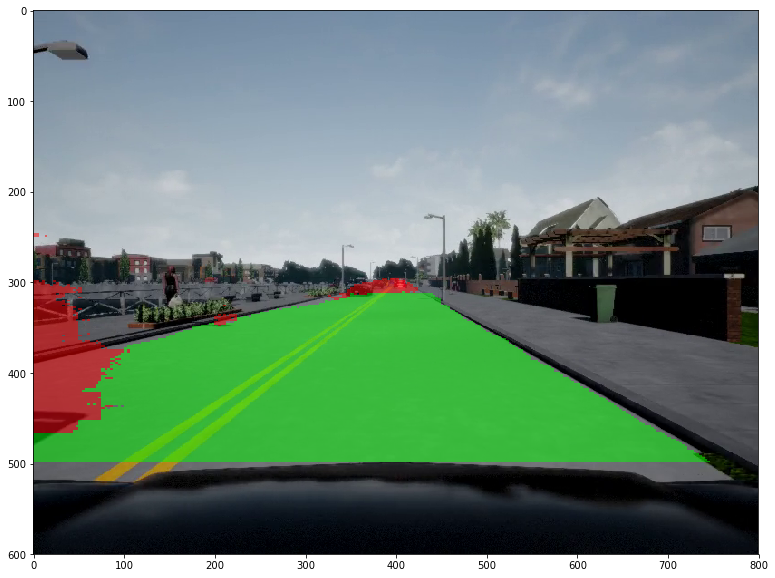

image shape: (600, 800)
car pixels: 1000
non-car pixels: 479000
road pixels: 94806
non-road pixels: 385194


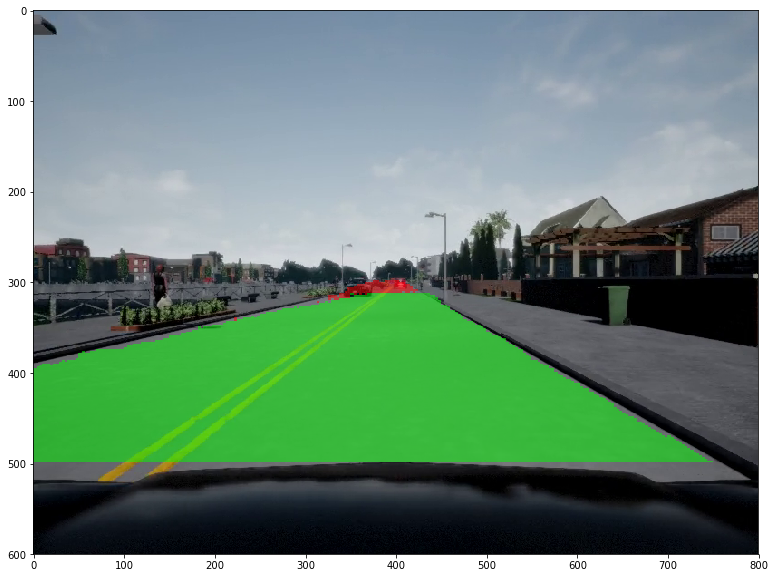

image shape: (600, 800)
car pixels: 1080
non-car pixels: 478920
road pixels: 95844
non-road pixels: 384156


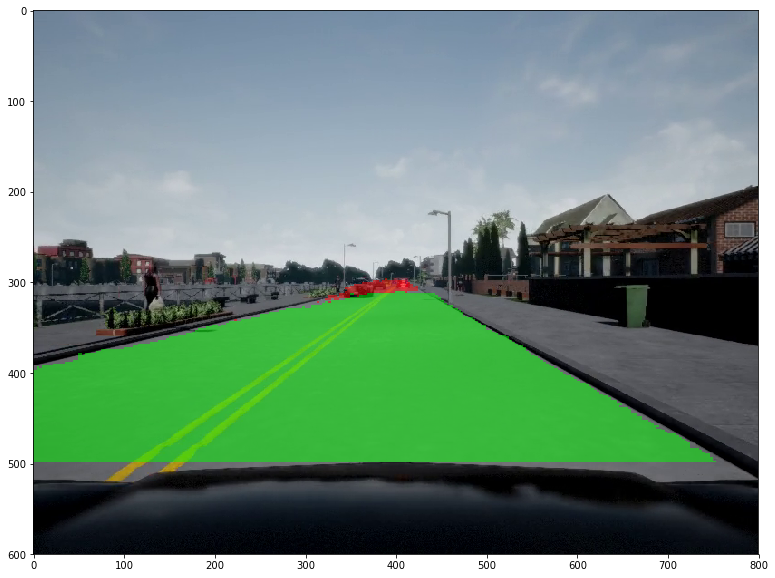

image shape: (600, 800)
car pixels: 1174
non-car pixels: 478826
road pixels: 96878
non-road pixels: 383122


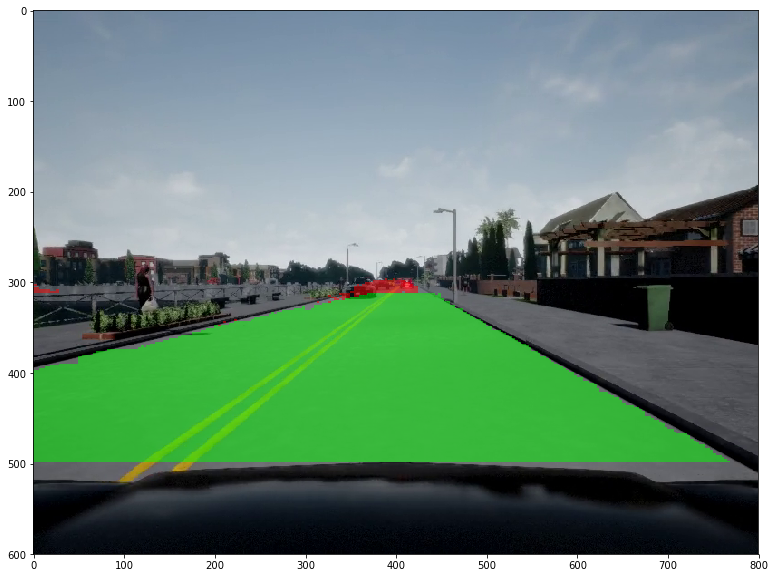

image shape: (600, 800)
car pixels: 1052
non-car pixels: 478948
road pixels: 95728
non-road pixels: 384272


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


image shape: (600, 800)
car pixels: 1841
non-car pixels: 478159
road pixels: 92432
non-road pixels: 387568


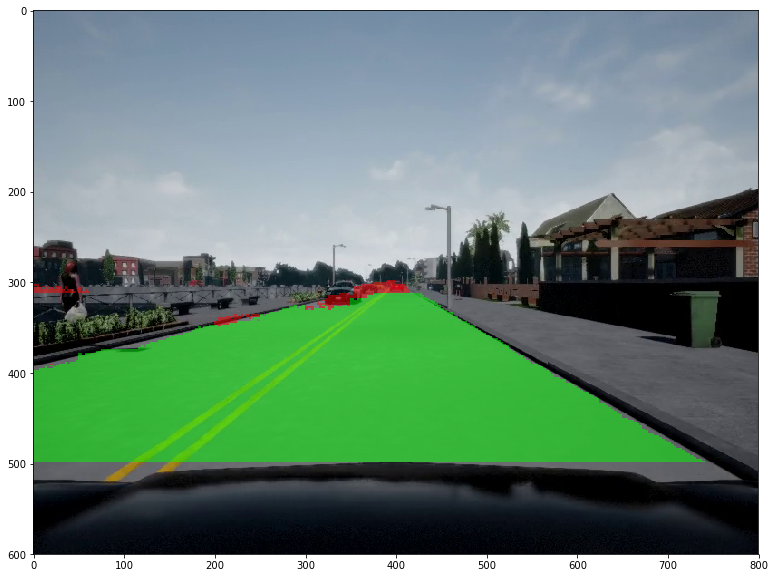

image shape: (600, 800)
car pixels: 1803
non-car pixels: 478197
road pixels: 91674
non-road pixels: 388326


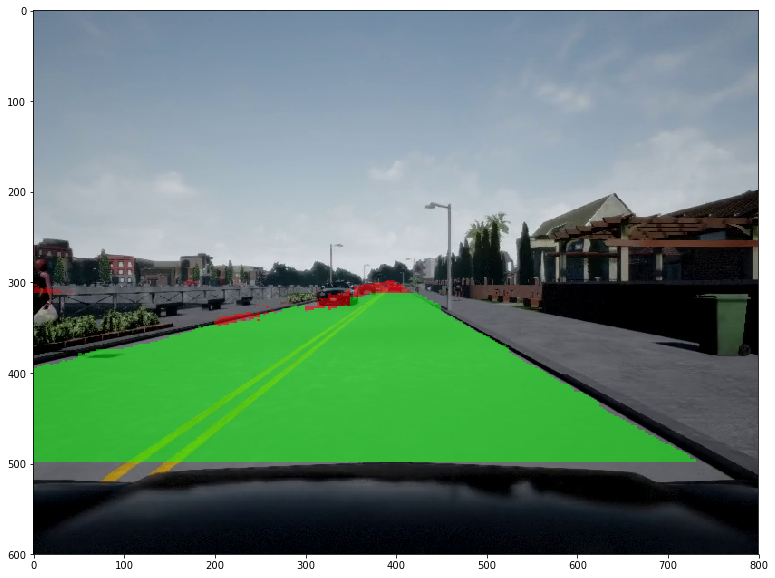

image shape: (600, 800)
car pixels: 1995
non-car pixels: 478005
road pixels: 91300
non-road pixels: 388700


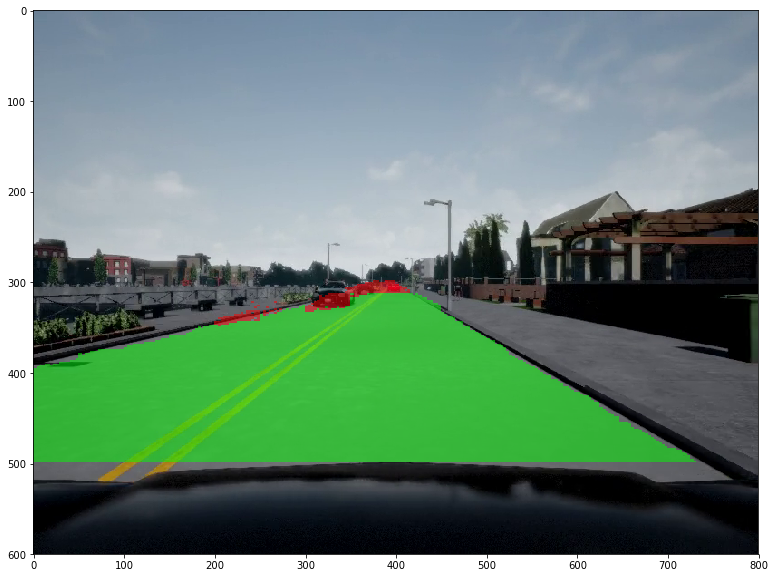

image shape: (600, 800)
car pixels: 1662
non-car pixels: 478338
road pixels: 92591
non-road pixels: 387409


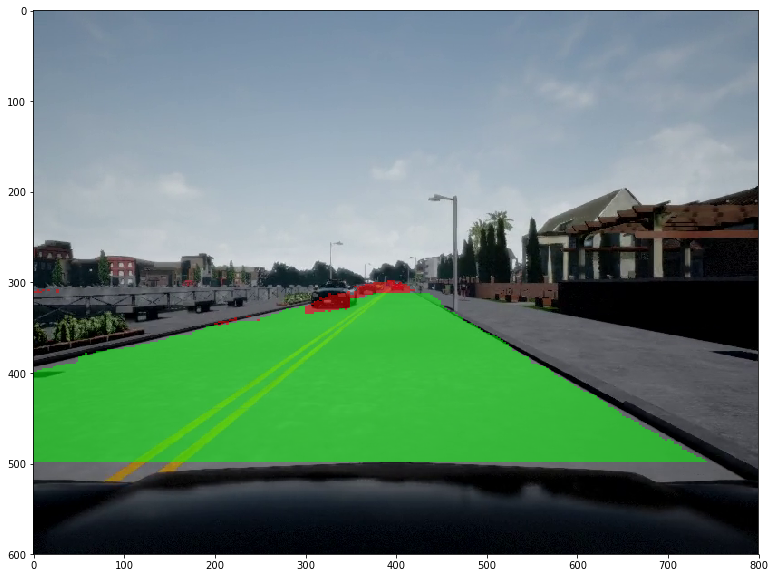

image shape: (600, 800)
car pixels: 1848
non-car pixels: 478152
road pixels: 93046
non-road pixels: 386954


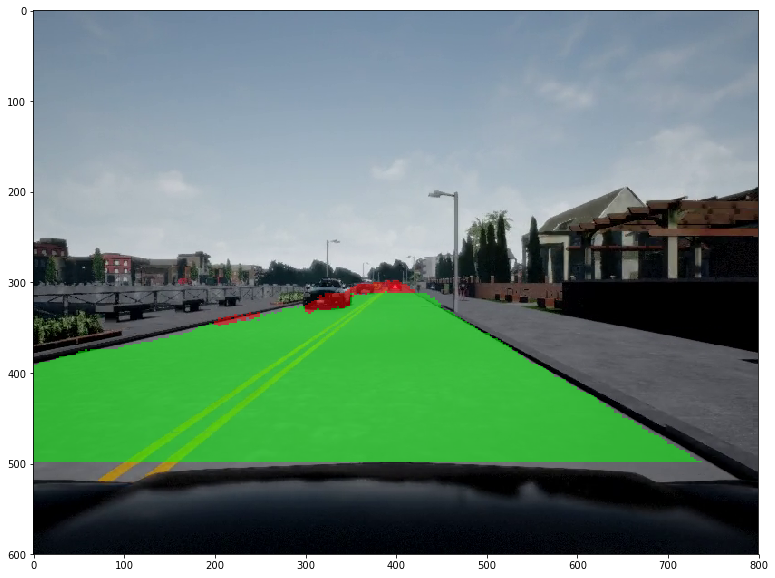

In [26]:
import json
import matplotlib.pyplot as plt
import base64
import numpy as np
import scipy.misc
import skvideo.io

VIDEO_PATH = "../Example/test_video.mp4"

# RESULTS_JSON_PATH = "../Example/results.json"
RESULTS_JSON_PATH = "saved_results/2018-05-12-2224.json"

def decode(packet):
    img = base64.b64decode(packet)
    filename = './image.png'
    with open(filename, 'wb') as f:
        f.write(img)
    result = scipy.misc.imread(filename)
    return result

with open(RESULTS_JSON_PATH) as json_file:
    results = json.load(json_file)
    
video = skvideo.io.vread(VIDEO_PATH)
frame = 1

for rgb_frame in video:
    key = str(frame)
    result = results[key]
    seg_car = decode(result[0])
    seg_road = decode(result[1])
    print("image shape:", seg_car.shape)
    print("car pixels:", np.sum(seg_car == 1))
    print("non-car pixels:", np.sum(seg_car == 0))
    print("road pixels:", np.sum(seg_road == 1))
    print("non-road pixels:", np.sum(seg_road == 0))
    
#     plt.figure(figsize=(15,15))
#     plt.subplot(221), plt.imshow(seg_car, cmap='gray')
#     plt.subplot(222), plt.imshow(seg_road, cmap='gray')
#     plt.show()

    seg_car = seg_car.reshape(rgb_frame.shape[0], rgb_frame.shape[1], 1)
    seg_road = seg_road.reshape(rgb_frame.shape[0], rgb_frame.shape[1], 1)
    
    mask = np.dot(seg_road, np.array([[0, 255, 0, 127]])) + \
           np.dot(seg_car, np.array([[255, 0, 0, 127]]))

    mask = scipy.misc.toimage(mask, mode="RGBA")

    street_im = scipy.misc.toimage(rgb_frame)
    street_im.paste(mask, box=None, mask=mask)
    
    plt.figure(figsize=(15,10))
    plt.imshow(street_im)
    plt.show()
    
    frame += 1